In [1]:
!pip install pyhull

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.8/318.8 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyhull: filename=pyhull-2015.2.1-cp310-cp310-linux_x86_64.whl size=490960 sha256=19ac4d4f082e2de91d9c4b26824caa3630c45661acda57ac60a9d2d91eee1303
  Stored in directory: /root/.cache/pip/wheels/1d/fd/7a/6ead61cb02ac9917e202f01599afaab1140810a9d471849e9b
Successfully built pyhull


In [2]:
!pip install plotly==5.21.0


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 50.2 MB/s eta 0:00:00
  Attempting uninstall: plotly
    Found existing installation: plotly 5.15.0
    Uninstalling plotly-5.15.0:
      Successfully uninstalled plotly-5.15.0


In [3]:
from pyhull.convex_hull import ConvexHull
from pyhull.delaunay import DelaunayTri
from pyhull.voronoi import VoronoiTess


In [4]:
import pandas as pd
import numpy as np
from scipy.spatial.transform import Rotation
from sympy import Matrix, pi, pprint
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


class GasSimulation:
    def __init__(self, file_path):
        self.file_path = file_path
        self.chunk_size = 102609 // 9
        self.load_data()

    def load_data(self):
        self.accumulated_data = np.zeros((0, 12))
        for chunk in pd.read_csv(self.file_path, sep=' ', names=['x', 'y', 'z', 'vx', 'vy', 'vz', 'lxvel', 'lyvel', 'lzvel','Potential', 'U', 'rho'], header=None, chunksize=self.chunk_size):
            self.accumulated_data = np.concatenate([self.accumulated_data, chunk.values])
        #print(len(self.accumulated_data[:, :3]))
        #print('antes de',self.accumulated_data[:, :3])

    def calculate_center_of_mass_new(self):
        mass_i = 1e10
        N = len(self.accumulated_data)
        Log_energy = np.log10(self.accumulated_data[:, 10])
        avg_energy = np.mean(Log_energy)
        #print('avr_energy',avg_energy)

        energy_filter = Log_energy < avg_energy
        self.filtered_data = self.accumulated_data[energy_filter]
        #print(len(self.filtered_data[:, :3]))
        #print('--array',self.filtered_data[:, :3])
        center_of_mass_with_energy = np.sum(self.filtered_data[:, :3], axis=0) / N
        return center_of_mass_with_energy

    def calculate_total_angular_momentum(self):
        center_of_mass = self.calculate_center_of_mass_new()
        mass_i = 1e10
        N = len(self.filtered_data[:, 6])
        r_i = self.filtered_data[:, :3] - center_of_mass
        v_i = self.filtered_data[:, 3:6] - self.calculate_velocity_of_mass()
        total_angular_momentum = np.sum(np.cross(r_i, v_i), axis=0)
        return total_angular_momentum

    def calculate_velocity_of_mass(self):
        mass_i = 1e10
        N = len(self.filtered_data[:, 6])
        velocity_of_mass = np.sum(self.filtered_data[:, 3:6] * mass_i, axis=0) / (mass_i * N)
        return velocity_of_mass

    def choose_rotation_matrix(self, largest_component, direction):
        if largest_component == 0:
            if direction == 1:
                matrix = Rotation.from_euler('y', -pi/2).as_matrix()
            elif direction == -1:
                matrix = Rotation.from_euler('y', pi/2).as_matrix()
        elif largest_component == 1:
            if direction == 1:
                matrix = Rotation.from_euler('x', pi/2).as_matrix()
            elif direction == -1:
                matrix = Rotation.from_euler('x', -pi/2).as_matrix()
        elif largest_component == 2:
            if direction == 1:
                matrix = np.identity(3)
            elif direction == -1:
                matrix = Rotation.from_euler('z', pi).as_matrix()
        return matrix

    def apply_rotation(self, matrix, vector):
        rotated_array = np.zeros_like(vector)
        if vector.size == 3:
            rotated_array = np.dot(matrix, vector)
        else:
            for i in range(vector.shape[0]):
                rotated_array[i, :] = np.dot(matrix, vector[i, :])
        return rotated_array

    def visualize_rotated_vector(self):
        direction = angular_direction[largest_component]
        angle_rotation_matrix = self.choose_rotation_matrix(largest_component, direction)
        original_vector = self.calculate_total_angular_momentum()
        rotated_angular_momentum = self.apply_rotation(angle_rotation_matrix, original_vector)
        print('-'*80)
        print("Vector Original:", original_vector)
        print("Vector Rotado:", rotated_angular_momentum)
        print('-'*80)
        print(' '*80)

    def visualize_galaxy(self, original_vector, rotated_vector, title):

          # Crear una figura con dos subgráficos en una fila
          fig, axs = plt.subplots(1, 2, figsize=(10, 4))

          # Gráfico de la izquierda: Datos Rotados
          axs[0].scatter(rotated_vector[:, 0], rotated_vector[:, 1], color='blue', marker='o', s=0.003)
          axs[0].scatter(center_of_mass[0], center_of_mass[1], color='red', marker='x', s=5, label='CM')

          axs[0].set_title('Rotado')
          axs[0].set_xlim(-18, 18)
          axs[0].set_ylim(-18, 18)
          axs[0].set_xlabel('Eje X')
          axs[0].set_ylabel('Eje Y')
          axs[0].legend()

          # Gráfico de la derecha: Datos Sin Rotar
          axs[1].scatter(original_vector[:, 0], original_vector[:, 1], color='blue', marker='o', s=0.003)
          axs[1].scatter(center_of_mass[0], center_of_mass[1], color='red', marker='x', s=5, label='CM')

          axs[1].set_title('Sin Rotar')
          axs[1].set_xlim(-18, 18)
          axs[1].set_ylim(-18, 18)
          axs[1].set_xlabel('Eje X')
          axs[1].set_ylabel('Eje Y')
          axs[1].legend()

          # Ajustar el diseño para evitar superposiciones
          plt.tight_layout()

          # Mostrar los gráficos
          plt.suptitle(title)
          plt.savefig(title)
          plt.show()
          #plt.savefig(title)

    def visualize_galaxies(self, vectors, title, ax):
        ax.scatter(vectors[:, 0], vectors[:, 1], color='blue', marker='o', s=0.003 )
        ax.scatter(center_of_mass[0], center_of_mass[1], color='black', marker='x', s=7, label='Centro de masa')

        #ax.set_title(title)
        ax.set_xlim(-30, 30)
        ax.set_ylim(-30, 30)
        ax.annotate(title.split('.')[0] +' '+ title.split(' ')[1], xy=(0.5, 1), xycoords='axes fraction', ha='center', va='bottom')
        ax.legend()

    def visualize_3d_comparison(self, rotated_vector, title_rotated, original_vector, title_original):
        fig = plt.figure(figsize=(19, 10))

        # Gráfico de la izquierda: Datos Rotados en 3D
        ax1 = fig.add_subplot(221, projection='3d')
        ax1.scatter(rotated_vector[:, 0], rotated_vector[:, 1], rotated_vector[:, 2], color='blue', marker='o', s=0.003)
        ax1.scatter(center_of_mass[0], center_of_mass[1], center_of_mass[2], color='red', marker='+', s=50, label='CM')

        ax1.set_title(title_rotated + '(edge on)')
        ax1.set_xlim(-15, 15)
        ax1.set_ylim(-15, 15)
        ax1.set_zlim(-15, 15)
        ax1.view_init(elev=0, azim=110)  # Vista personalizada
        ax1.set_xlabel('Eje X')
        ax1.set_ylabel('Eje Y')
        ax1.set_zlabel('Eje Z')

        # Cambiar la posición de la caja que encierra el gráfico
        ax1.xaxis.pane.fill = False
        ax1.yaxis.pane.fill = False
        ax1.zaxis.pane.fill = False
        ax1.grid(alpha=0.3)

        # Gráfico de la izquierda: Datos Rotados en 3D
        ax3 = fig.add_subplot(223, projection='3d')
        ax3.scatter(rotated_vector[:, 0], rotated_vector[:, 1], rotated_vector[:, 2], color='blue', marker='o', s=0.003)
        ax3.scatter(center_of_mass[0], center_of_mass[1], center_of_mass[2], color='red', marker='+', s=50, label='CM')

        ax3.set_title(title_rotated + '(face on)')
        ax3.set_xlim(-15, 15)
        ax3.set_ylim(-15, 15)
        ax3.set_zlim(-15, 15)
        ax3.view_init(elev=84, azim=91)  # Vista personalizada
        ax3.set_xlabel('Eje X')
        ax3.set_ylabel('Eje Y')
        ax3.set_zlabel('Eje Z')

        # Cambiar la posición de la caja que encierra el gráfico
        ax3.xaxis.pane.fill = False
        ax3.yaxis.pane.fill = False
        ax3.zaxis.pane.fill = False
        ax3.grid(alpha=0.3)

        # Gráfico de la derecha: Datos Sin Rotar en 3D
        ax2 = fig.add_subplot(222, projection='3d')
        ax2.scatter(original_vector[:, 0], original_vector[:, 1], original_vector[:, 2], color='blue', marker='o', s=0.003)
        ax2.scatter(center_of_mass[0], center_of_mass[1], center_of_mass[2], color='red', marker='+', s=50, label='CM')

        ax2.set_title(title_original + '(edge on)')
        ax2.set_xlim(-15, 15)
        ax2.set_ylim(-15, 15)
        ax2.set_zlim(-15, 15)
        ax2.view_init(elev=0, azim=110)  # Vista personalizada
        ax2.set_xlabel('Eje X')
        ax2.set_ylabel('Eje Y')
        ax2.set_zlabel('Eje Z')

        # Cambiar la posición de la caja que encierra el gráfico
        ax2.xaxis.pane.fill = False
        ax2.yaxis.pane.fill = False
        ax2.zaxis.pane.fill = False
        ax2.grid(alpha=0.3)

        # Gráfico de la derecha: Datos Sin Rotar en 3D
        ax4 = fig.add_subplot(224, projection='3d')
        ax4.scatter(original_vector[:, 0], original_vector[:, 1], original_vector[:, 2], color='blue', marker='o', s=0.003)
        ax4.scatter(center_of_mass[0], center_of_mass[1], center_of_mass[2], color='red', marker='+', s=50, label='CM')

        ax4.set_title(title_original + '(face on)')
        ax4.set_xlim(-15, 15)
        ax4.set_ylim(-15, 15)
        ax4.set_zlim(-15, 15)
        ax4.view_init(elev=84, azim=91)  # Vista personalizada
        ax4.set_xlabel('Eje X')
        ax4.set_ylabel('Eje Y')
        ax4.set_zlabel('Eje Z')

        # Cambiar la posición de la caja que encierra el gráfico
        ax4.xaxis.pane.fill = False
        ax4.yaxis.pane.fill = False
        ax4.zaxis.pane.fill = False
        ax4.grid(alpha=0.3)

        plt.rcParams['grid.linewidth'] = 0.2  # change linwidth
        plt.rcParams['grid.color'] = "gray"  # change color
        plt.tight_layout()

        # Mostrar los gráficos
        plt.show()

        #convex hull - teselación

    def create_disk(self, center, radius):
        """
        Create a disk based on the center and radius.
        """
        theta = np.linspace(0, 2 * np.pi, 100)
        x = center[0] + radius * np.cos(theta)
        y = center[1] + radius * np.sin(theta)
        return x, y

    def classify_points(self, points, center, radius):
        """
        Classify points as inside or outside the disk based on distance.
        """
        inside_points = []
        outside_points = []
        for point in points:
            distance = np.linalg.norm(point - center)
            if distance <= radius:
                inside_points.append(point)
            else:
                outside_points.append(point)
        return np.array(inside_points), np.array(outside_points)

    def visualize_disk_and_points(self, points, center, radius):
        """
        Visualize the disk and classified points.
        """
        inside_points, outside_points = self.classify_points(points, center, radius)
        x_disk, y_disk = self.create_disk(center, radius)

        plt.figure(figsize=(8, 8))
        plt.scatter(inside_points[:, 0], inside_points[:, 1], color='green', label='Inside Disk')
        plt.scatter(outside_points[:, 0], outside_points[:, 1], color='red', label='Outside Disk')
        plt.plot(x_disk, y_disk, color='blue', label='Disk')

        plt.scatter(center[0], center[1], color='black', marker='x', s=100, label='Center of Mass')

        plt.title('Classification of Points')
        plt.xlabel('X-axis')
        plt.ylabel('Y-axis')
        plt.legend()
        plt.grid(True)
        plt.show()

    def create_convex_hull(self, points):
        """
        Create a convex hull around the points using pyhull.
        """
        points_str = [f"{point[0]} {point[1]}" for point in points]
        output = hull.qconvex("s n", points_str)
        vertices = [list(map(int, line.split())) for line in output[1:]]
        return np.array(vertices)

    def is_point_inside_convex_hull(self, point, convex_hull_vertices):
        """
        Check if a point is inside the convex hull.
        """
        point_str = f"{point[0]} {point[1]}"
        output = hull.qhull_cmd("qhull", "i", [point_str] + convex_hull_vertices.tolist())
        return output[0] == '0'

    def visualize_convex_hull_data(self, points, convex_hull_vertices):
        """
        Visualize the convex hull and classified points.
        """
        inside_points = []
        outside_points = []

        for point in points:
            if self.is_point_inside_convex_hull(point, convex_hull_vertices):
                inside_points.append(point)
            else:
                outside_points.append(point)

        inside_points = np.array(inside_points)
        outside_points = np.array(outside_points)

        plt.figure(figsize=(8, 8))
        plt.scatter(inside_points[:, 0], inside_points[:, 1], color='green', label='Inside Convex Hull')
        plt.scatter(outside_points[:, 0], outside_points[:, 1], color='red', label='Outside Convex Hull')

        plt.plot(convex_hull_vertices[:, 0], convex_hull_vertices[:, 1], color='blue', label='Convex Hull')

        plt.title('Classification of Points using Convex Hull')
        plt.xlabel('X-axis')
        plt.ylabel('Y-axis')
        plt.legend()
        plt.grid(True)
        plt.show()

    def calculate_convex_hull(self, limit_radius, rotated_vectors):
        points = rotated_vectors[:, :2]
        # x= rotated_vector[:, 0], y= rotated_vector[:, 1]
        indices_within_radius = np.linalg.norm(points, axis=1) <= limit_radius
        points_within_radius = points[indices_within_radius]
        hull = ConvexHull(points_within_radius)
        return hull

    def visualize_convex_hull(self, hull):
        fig = plt.figure(figsize=(8, 8))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(self.filtered_data[:, 0], self.filtered_data[:, 1], self.filtered_data[:, 2], c='blue', s=0.003)
        for simplex in hull.vertices:
            simplex = np.append(simplex, simplex[0])  # cerrar el polígono
            ax.plot(self.filtered_data[simplex, 0], self.filtered_data[simplex, 1], self.filtered_data[simplex, 2], 'r-')
        ax.set_title('Envolvente Convexa con Límite de Radio')
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        plt.show()

    def visualize_convex_hull_2d(self, hull):
        plt.figure(figsize=(8, 6))
        plt.scatter(self.filtered_data[:, 0], self.filtered_data[:, 1], c='blue', s=0.003)
        for simplex in hull.vertices:
            simplex = np.append(simplex, simplex[0])  # Cerrar el polígono
            plt.plot(self.filtered_data[simplex, 0], self.filtered_data[simplex, 1], 'r-')
        plt.title('Envolvente Convexa en 2D con Límite de Radio')
        plt.xlabel('X')
        plt.ylabel('Y')
        plt.show()

Centro de Masa: [ 1.1164593  -0.77058005 -2.38645101]
Momento Angular Total: [54778169.77548568 40628132.67189121 28320285.31394039]
La componente más grande del momento angular es: 0 -- sign -- 1.0
--------------------------------------------------------------------------------
Vector Original: [54778169.77548568 40628132.67189121 28320285.31394039]
Vector Rotado: [-28320285.31394038  40628132.67189121  54778169.77548569]
--------------------------------------------------------------------------------
                                                                                


<ipython-input-4-5f06a3364373>:122: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(title)


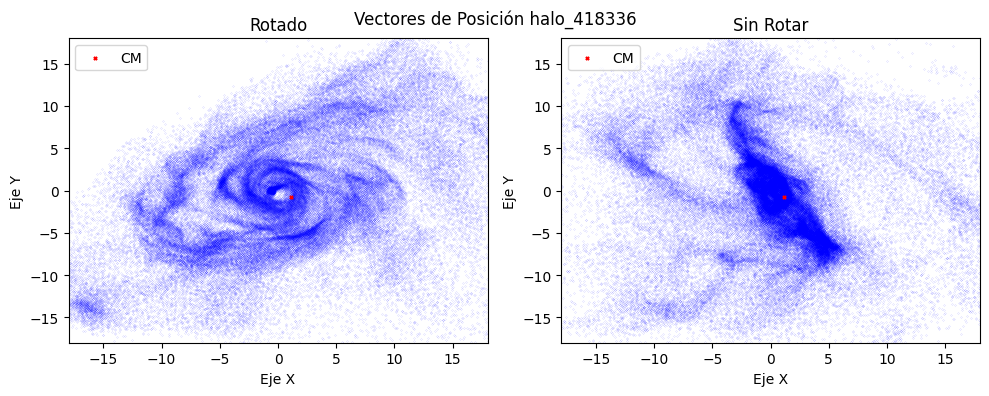

In [5]:
if __name__ == "__main__":
    simulation = GasSimulation('dhc_halo_17.gas')
    center_of_mass = simulation.calculate_center_of_mass_new()
    total_angular_momentum = simulation.calculate_total_angular_momentum()
    angular_direction = np.sign(total_angular_momentum)
    largest_component = np.argmax(np.abs(total_angular_momentum))

    print("Centro de Masa:", center_of_mass)
    print("Momento Angular Total:", total_angular_momentum)
    print("La componente más grande del momento angular es:", largest_component, '-- sign --', angular_direction[largest_component])

    simulation.visualize_rotated_vector()

    direction = angular_direction[largest_component]
    angle_rotation_matrix = simulation.choose_rotation_matrix(largest_component, direction)

    # vector a rotar, ahora es el vector posición
    original_vector = simulation.accumulated_data[:, :3]

    # Aplica la rotación al vector posición
    rotated_vectors = simulation.apply_rotation(angle_rotation_matrix, original_vector)

    # Visualizar los vectores rotados
    simulation.visualize_galaxy(original_vector, rotated_vectors, 'Vectores de Posición halo_418336')

In [ ]:
#simulation.visualize_3d_comparison(rotated_vectors, 'Vectores de Posición Rotados', original_vector, 'Vectores de Posición Originales')


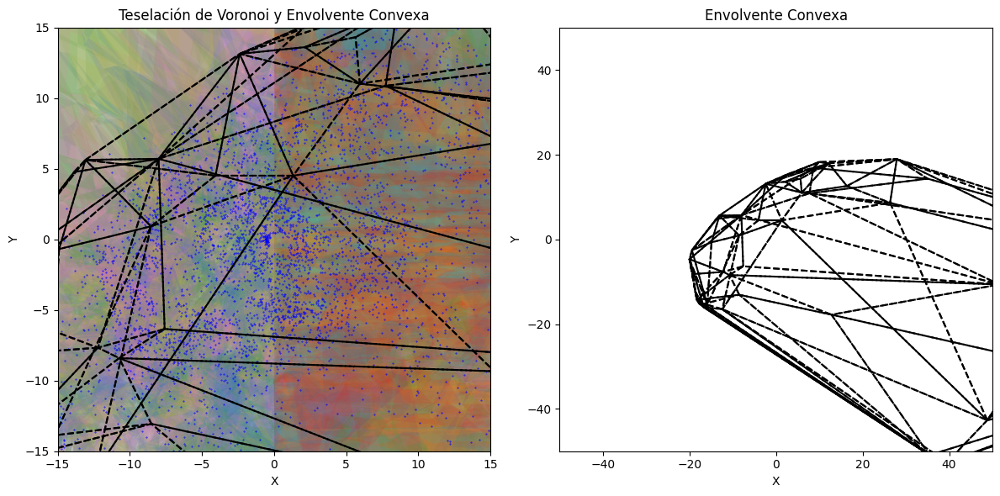

In [6]:
import numpy as np
import matplotlib.pyplot as plt

#-----------------------------usando solo pyhull------------------------------
from pyhull.convex_hull import ConvexHull
#-----------------------------------------------------------------------

x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Elegir un número pequeño de puntos aleatorios por coordenada
n_points_per_coord = 5000
sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=False)
sample_points = points_3d[sample_indices]

# Calcular la envolvente convexa
hull_3d = ConvexHull(sample_points)

# Calcular la teselación de Voronoi para la muestra de puntos
voronoi_sample = VoronoiTess(sample_points)
vertices_voronoi = np.array(voronoi_sample.vertices)  # Convertir a NumPy array
regions_voronoi = voronoi_sample.regions

# Crear una figura con dos subgráficos en una fila
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Graficar la teselación de Voronoi en el primer subgráfico
for region in regions_voronoi:
    polygon = [vertices_voronoi[i] for i in region]
    axs[0].fill(*zip(*polygon), alpha=0.15)

# Graficar la envolvente convexa en el primer subgráfico
for simplex in hull_3d.vertices:
   simplex = np.append(simplex, simplex[0])  # cerrar el polígono
   axs[0].plot(sample_points[simplex, 0], sample_points[simplex, 1], 'k--')


# Graficar los puntos generados en el primer subgráfico
axs[0].scatter(sample_points[:, 0], sample_points[:, 1], color='blue', marker='o', s=0.15)

# Configuración del primer subgráfico
axs[0].set_title('Teselación de Voronoi y Envolvente Convexa')
axs[0].set_xlim(-15, 15)
axs[0].set_ylim(-15, 15)
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')

# Graficar solo la envolvente convexa en el segundo subgráfico
for simplex in hull_3d.vertices:
   simplex = np.append(simplex, simplex[0])  # cerrar el polígono
   axs[1].plot(sample_points[simplex, 0], sample_points[simplex, 1], 'k--')
# Configuración del segundo subgráfico
axs[1].set_title('Envolvente Convexa')
axs[1].set_xlim(-50, 50)
axs[1].set_ylim(-50, 50)
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')

# Ajustar el diseño para evitar superposiciones
plt.tight_layout()

# Mostrar los gráficos
plt.show()


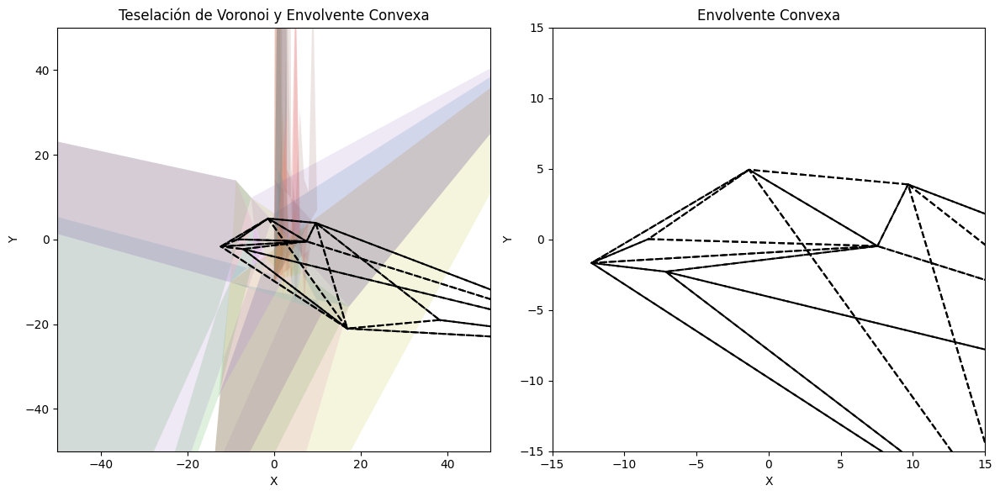

In [7]:
import numpy as np
import matplotlib.pyplot as plt

#-----------------------------usando solo pyhull------------------------------
from pyhull.convex_hull import ConvexHull
#-----------------------------------------------------------------------

x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Elegir un número pequeño de puntos aleatorios por coordenada
n_points_per_coord = 10
sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=False)
sample_points = points_3d[sample_indices]

# Calcular la envolvente convexa
hull_3d = ConvexHull(sample_points)

# Calcular la teselación de Voronoi para la muestra de puntos
voronoi_sample = VoronoiTess(sample_points)
vertices_voronoi = np.array(voronoi_sample.vertices)  # Convertir a NumPy array
regions_voronoi = voronoi_sample.regions

# Crear una figura con dos subgráficos en una fila
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Graficar la teselación de Voronoi en el primer subgráfico
for region in regions_voronoi:
    polygon = [vertices_voronoi[i] for i in region]
    axs[0].fill(*zip(*polygon), alpha=0.15)

# Graficar la envolvente convexa en el primer subgráfico
for simplex in hull_3d.vertices:
   simplex = np.append(simplex, simplex[0])  # cerrar el polígono
   axs[0].plot(sample_points[simplex, 0], sample_points[simplex, 1], 'k--')


# Graficar los puntos generados en el primer subgráfico
axs[0].scatter(sample_points[:, 0], sample_points[:, 1], color='blue', marker='o', s=0.15)

# Configuración del primer subgráfico
axs[0].set_title('Teselación de Voronoi y Envolvente Convexa')
axs[0].set_xlim(-50,50)
axs[0].set_ylim(-50,50)
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')

# Graficar solo la envolvente convexa en el segundo subgráfico
for simplex in hull_3d.vertices:
   simplex = np.append(simplex, simplex[0])  # cerrar el polígono
   axs[1].plot(sample_points[simplex, 0], sample_points[simplex, 1], 'k--')
# Configuración del segundo subgráfico
axs[1].set_title('Envolvente Convexa')
axs[1].set_xlim(-15,15)
axs[1].set_ylim(-15,15)
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')

# Ajustar el diseño para evitar superposiciones
plt.tight_layout()

# Mostrar los gráficos
plt.show()


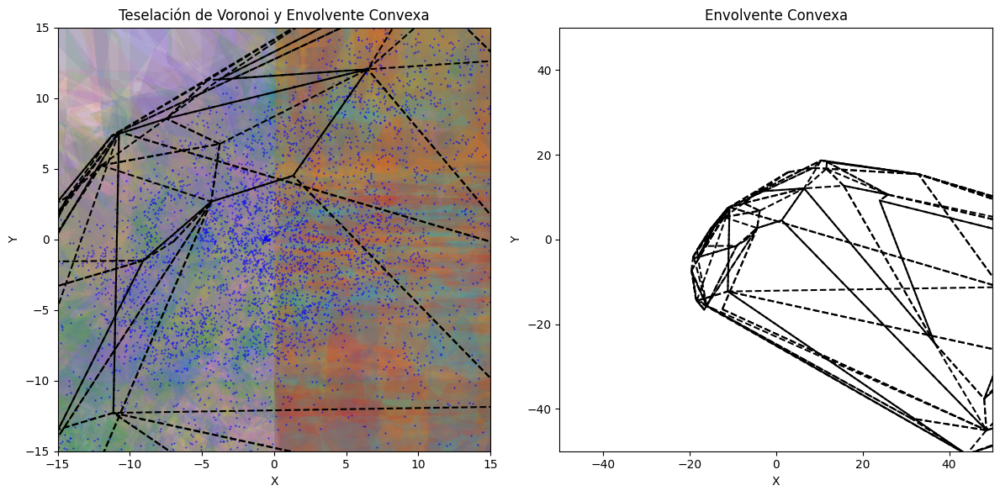

In [8]:
import numpy as np
import matplotlib.pyplot as plt
#-----------------------------usando scipy------------------------------
from scipy.spatial import ConvexHull
#-----------------------------------------------------------------------
x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Elegir un número pequeño de puntos aleatorios por coordenada
n_points_per_coord = 5000
sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=False)
sample_points = points_3d[sample_indices]

# Calcular la envolvente convexa
hull_3d = ConvexHull(sample_points)

# Calcular la teselación de Voronoi para la muestra de puntos
voronoi_sample = VoronoiTess(sample_points)
vertices_voronoi = np.array(voronoi_sample.vertices)  # Convertir a NumPy array
regions_voronoi = voronoi_sample.regions

# Crear una figura con dos subgráficos en una fila
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Graficar la teselación de Voronoi en el primer subgráfico
for region in regions_voronoi:
    polygon = [vertices_voronoi[i] for i in region]
    axs[0].fill(*zip(*polygon), alpha=0.15)

# Graficar la envolvente convexa en el primer subgráfico
for simplex in hull_3d.simplices:
    axs[0].plot(sample_points[simplex, 0], sample_points[simplex, 1], 'k--')

# Graficar los puntos generados en el primer subgráfico
axs[0].scatter(sample_points[:, 0], sample_points[:, 1], color='blue', marker='o', s=0.15)

# Configuración del primer subgráfico
axs[0].set_title('Teselación de Voronoi y Envolvente Convexa')
axs[0].set_xlim(-15, 15)
axs[0].set_ylim(-15, 15)
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')

# Graficar solo la envolvente convexa en el segundo subgráfico
for simplex in hull_3d.simplices:
    axs[1].plot(sample_points[simplex, 0], sample_points[simplex, 1], 'k--')

# Configuración del segundo subgráfico
axs[1].set_title('Envolvente Convexa')
axs[1].set_xlim(-50, 50)
axs[1].set_ylim(-50, 50)
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')

# Ajustar el diseño para evitar superposiciones
plt.tight_layout()

# Mostrar los gráficos
plt.show()


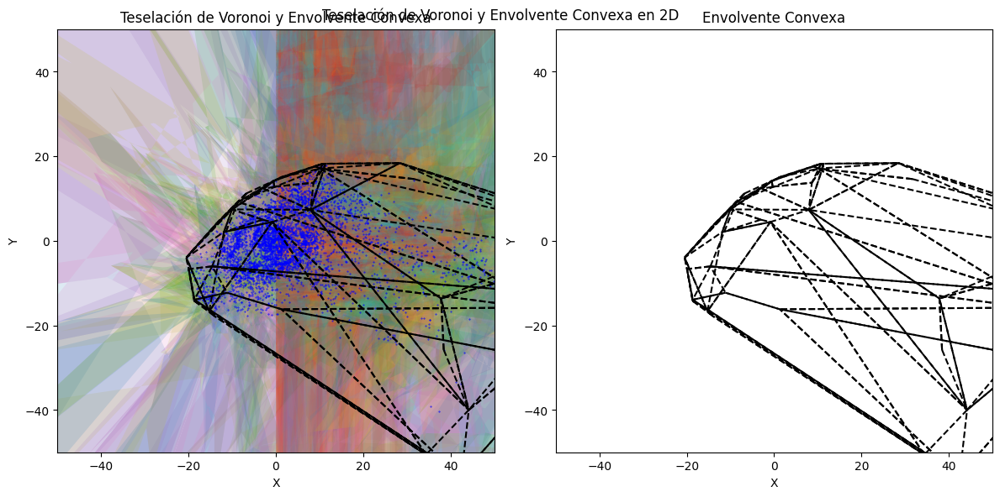

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from pyhull.voronoi import VoronoiTess

x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Elegir un número pequeño de puntos aleatorios por coordenada
n_points_per_coord = 5000
sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=False)
sample_points = points_3d[sample_indices]

# Calcular la envolvente convexa
hull_3d = ConvexHull(sample_points)

# Calcular la teselación de Voronoi para la muestra de puntos
voronoi_sample = VoronoiTess(sample_points)
vertices_voronoi = np.array(voronoi_sample.vertices)  # Convertir a NumPy array
regions_voronoi = voronoi_sample.regions

# Crear una figura con dos subgráficos en una fila
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Graficar la teselación de Voronoi en el primer subgráfico
for region in regions_voronoi:
    polygon = [vertices_voronoi[i] for i in region]
    axs[0].fill(*zip(*polygon), alpha=0.15)

# Graficar la envolvente convexa en el primer subgráfico
for simplex in hull_3d.simplices:
    axs[0].plot(sample_points[simplex, 0], sample_points[simplex, 1], 'k--')

# Graficar los puntos generados en el primer subgráfico
axs[0].scatter(sample_points[:, 0], sample_points[:, 1], color='blue', marker='o', s=0.15)

# Configuración del primer subgráfico
axs[0].set_title('Teselación de Voronoi y Envolvente Convexa')
axs[0].set_xlim(-50, 50)
axs[0].set_ylim(-50, 50)
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')

# Graficar solo la envolvente convexa en el segundo subgráfico
for simplex in hull_3d.simplices:
    axs[1].plot(sample_points[simplex, 0], sample_points[simplex, 1], 'k--')

# Configuración del segundo subgráfico
axs[1].set_title('Envolvente Convexa')
axs[1].set_xlim(-50, 50)
axs[1].set_ylim(-50, 50)
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')

# Ajustar el diseño para evitar superposiciones
plt.tight_layout()

# Mostrar los gráficos
plt.suptitle('Teselación de Voronoi y Envolvente Convexa en 2D')
plt.show()


IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

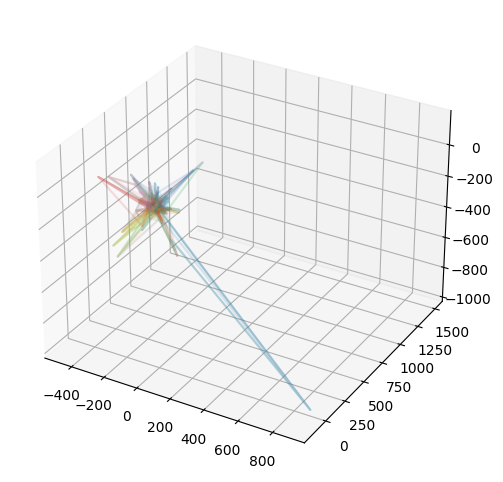

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from pyhull.voronoi import VoronoiTess

x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Elegir un número pequeño de puntos aleatorios por coordenada
n_points_per_coord = 5000
sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=False)
sample_points = points_3d[sample_indices]

# Calcular la envolvente convexa
hull_3d = ConvexHull(sample_points)

# Crear la figura en 3D
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, projection='3d')

# Graficar la teselación de Voronoi
voronoi_sample = VoronoiTess(sample_points)
vertices_voronoi = np.array(voronoi_sample.vertices)
regions_voronoi = voronoi_sample.regions
for region in regions_voronoi:
    polygon = [vertices_voronoi[i] for i in region]
    ax.plot(*zip(*polygon), alpha=0.15)

# Graficar la envolvente convexa
for simplex in hull_3d.simplices:
    ax.plot(sample_points[simplex, 0], sample_points[simplex, 1], sample_points[simplex, 2], 'k--')

# Graficar los puntos generados
ax.scatter(sample_points[:, 0], sample_points[:, 1], sample_points[:, 2], color='blue', marker='o', s=10)

# Configuración del gráfico en 3D
ax.set_title('Teselación de Voronoi y Envolvente Convexa en 3D')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()


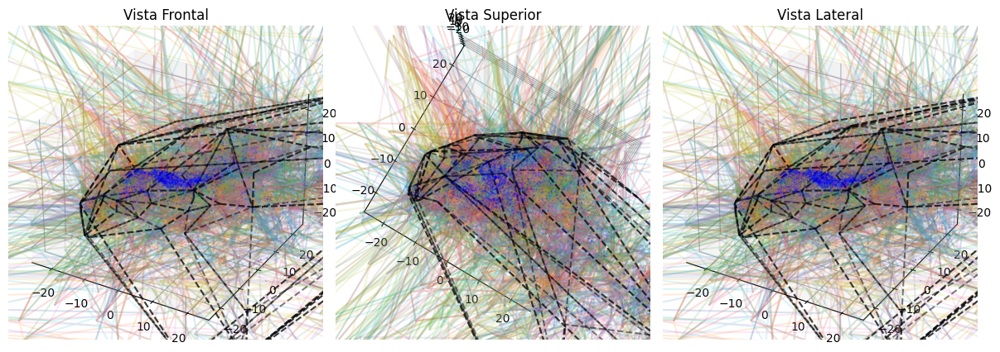

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from pyhull.voronoi import VoronoiTess


# Definir los puntos en 3D
x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Elegir un número pequeño de puntos aleatorios por coordenada
n_points_per_coord = 5000
sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=True)
sample_points = points_3d[sample_indices]

# Calcular la envolvente convexa
hull_3d = ConvexHull(sample_points)

# Crear la figura en 3D
fig = plt.figure(figsize=(12, 8))

# Subplot 1: Vista desde el frente
ax1 = fig.add_subplot(131, projection='3d')
for region in regions_voronoi:
    polygon = [vertices_voronoi[i] for i in region]
    ax1.plot(*zip(*polygon), alpha=0.15)
for simplex in hull_3d.simplices:
    ax1.plot(sample_points[simplex, 0], sample_points[simplex, 1], sample_points[simplex, 2], 'k--', alpha=0.5)
ax1.scatter(sample_points[:, 0], sample_points[:, 1], sample_points[:, 2], color='blue', marker='o', s=0.03)
ax1.set_title('Vista Frontal')
ax1.set_xlim(-25,25)
ax1.set_ylim(-25,25)
ax1.set_zlim(-25,25)

# Subplot 2: Vista desde arriba
ax2 = fig.add_subplot(132, projection='3d')
for region in regions_voronoi:
    polygon = [vertices_voronoi[i] for i in region]
    ax2.plot(*zip(*polygon), alpha=0.15)
for simplex in hull_3d.simplices:
    ax2.plot(sample_points[simplex, 0], sample_points[simplex, 1], sample_points[simplex, 2], 'k--', alpha=0.5)
ax2.scatter(sample_points[:, 0], sample_points[:, 1], sample_points[:, 2], color='blue', marker='o', s=0.03)
ax2.set_title('Vista Superior')
ax2.set_xlim(-25,25)
ax2.set_ylim(-25,25)
ax2.set_zlim(-25,25)
ax2.view_init(90)
# Subplot 3: Vista desde el lado
ax3 = fig.add_subplot(133, projection='3d')
for region in regions_voronoi:
    polygon = [vertices_voronoi[i] for i in region]
    ax3.plot(*zip(*polygon), alpha=0.15)
for simplex in hull_3d.simplices:
    ax3.plot(sample_points[simplex, 0], sample_points[simplex, 1], sample_points[simplex, 2], 'k--', alpha=0.5)
ax3.scatter(sample_points[:, 0], sample_points[:, 1], sample_points[:, 2], color='blue', marker='o', s=0.03)
ax3.set_title('Vista Lateral')
ax3.set_xlim(-25,25)
ax3.set_ylim(-25,25)
ax3.set_zlim(-25,25)
ax3.view_init(30)
plt.tight_layout()
plt.show()


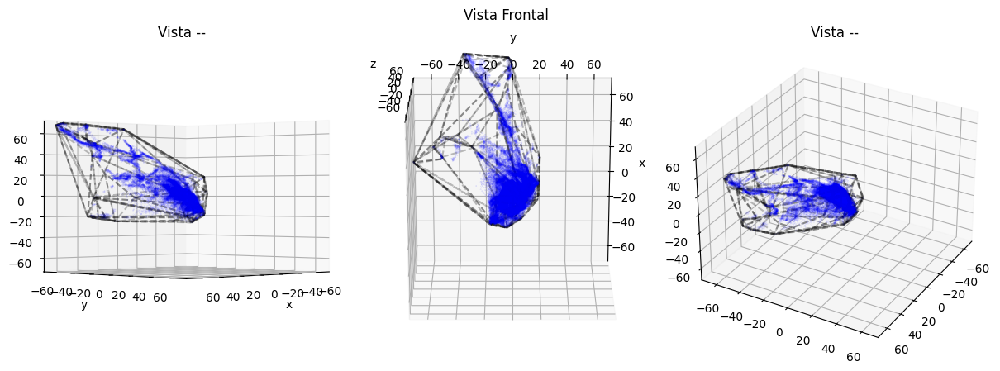

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from pyhull.voronoi import VoronoiTess

# Definir los puntos en 3D
x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Elegir un número pequeño de puntos aleatorios por coordenada
##n_points_per_coord = 10000
#sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=True)
#points_3d = points_3d[sample_indices]

# Calcular la envolvente convexa
hull_3d = ConvexHull(points_3d)

# Crear la figura en 3D
fig = plt.figure(figsize=(12, 8))

# Subplot 1: Vista desde el frente
ax1 = fig.add_subplot(131, projection='3d')
for simplex in hull_3d.simplices:
    ax1.plot(points_3d[simplex, 0], points_3d[simplex, 1], points_3d[simplex, 2], 'k--', alpha=0.25)
ax1.scatter(points_3d[:, 0], points_3d[:, 1], points_3d[:, 2], color='blue', marker='o', s=0.003)
ax1.set_title('Vista --')
ax1.set_xlim(-70,70)
ax1.set_ylim(-70,70)
ax1.set_zlim(-70,70)
ax1.view_init(0,45)
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('z')

# Subplot 2: Vista desde arriba
ax2 = fig.add_subplot(132, projection='3d')
for simplex in hull_3d.simplices:
    ax2.plot(points_3d[simplex, 0], points_3d[simplex, 1], points_3d[simplex, 2], 'k--', alpha=0.25)
ax2.scatter(points_3d[:, 0], points_3d[:, 1], points_3d[:, 2], color='blue', marker='o', s=0.003)
ax2.set_title('Vista Frontal \n')
ax2.set_xlim(-70,70)
ax2.set_ylim(-70,70)
ax2.set_zlim(-70,70)
ax2.view_init(-70,360)
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('z')
# Subplot 3: Vista desde el lado
ax3 = fig.add_subplot(133, projection='3d')

for simplex in hull_3d.simplices:
    ax3.plot(points_3d[simplex, 0], points_3d[simplex, 1], points_3d[simplex, 2], 'k--', alpha=0.25)
ax3.scatter(points_3d[:, 0], points_3d[:, 1], points_3d[:, 2], color='blue', marker='o', s=0.003)
ax3.set_title('Vista --')
ax3.set_xlim(-70,70)
ax3.set_ylim(-70,70)
ax3.set_zlim(-70,70)
ax3.view_init(30,30)
plt.tight_layout()
plt.show()


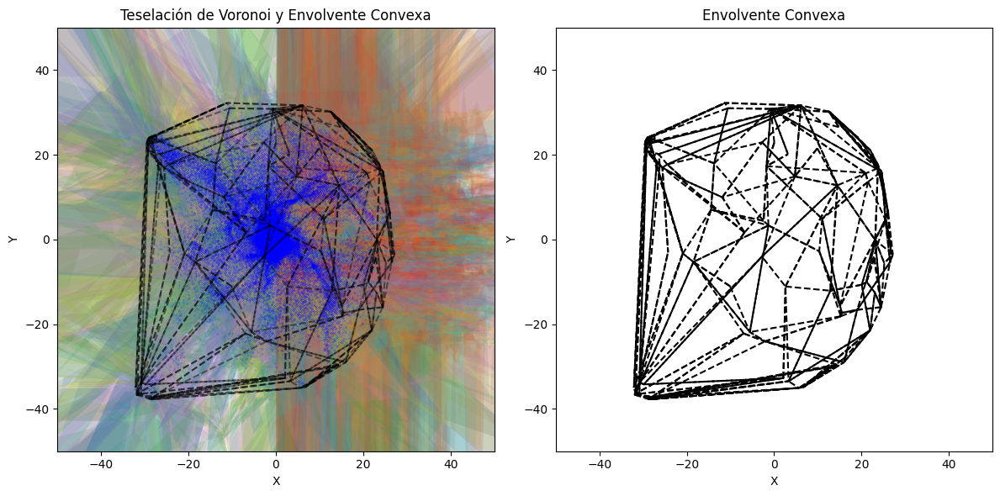

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pyhull.voronoi import VoronoiTess

x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

#-------------------------------------------------------
#----------------TOTAL DE PUNTOS ------------------------
#--------------------------------------------------------
# Elegir un número pequeño de puntos aleatorios por coordenada
#n_points_per_coord = len()
#sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=False)
#sample_points = points_3d[sample_indices]

# Calcular la envolvente convexa
hull_3d = ConvexHull(points_3d)

# Calcular la teselación de Voronoi para la muestra de puntos
voronoi_sample = VoronoiTess(points_3d)
vertices_voronoi = np.array(voronoi_sample.vertices)  # Convertir a NumPy array
regions_voronoi = voronoi_sample.regions

# Crear una figura con dos subgráficos en una fila
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Graficar la teselación de Voronoi en el primer subgráfico
for region in regions_voronoi:
    polygon = [vertices_voronoi[i] for i in region]
    axs[0].fill(*zip(*polygon), alpha=0.15)

# Graficar la envolvente convexa en el primer subgráfico
for simplex in hull_3d.simplices:
    axs[0].plot(points_3d[simplex, 0], points_3d[simplex, 1], 'k--', alpha=0.45)

# Graficar los puntos generados en el primer subgráfico
axs[0].scatter(points_3d[:, 0], points_3d[:, 1], color='blue', marker='o', s=0.015)  # s=0.003

# Configuración del primer subgráfico
axs[0].set_title('Teselación de Voronoi y Envolvente Convexa')
axs[0].set_xlim(-50, 50)
axs[0].set_ylim(-50, 50)
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')

# Graficar solo la envolvente convexa en el segundo subgráfico
for simplex in hull_3d.simplices:
    axs[1].plot(points_3d[simplex, 0], points_3d[simplex, 1], 'k--')

# Configuración del segundo subgráfico
axs[1].set_title('Envolvente Convexa')
axs[1].set_xlim(-50, 50)
axs[1].set_ylim(-50, 50)
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')

# Ajustar el diseño para evitar superposiciones
plt.tight_layout()

# Mostrar los gráficos
plt.show()


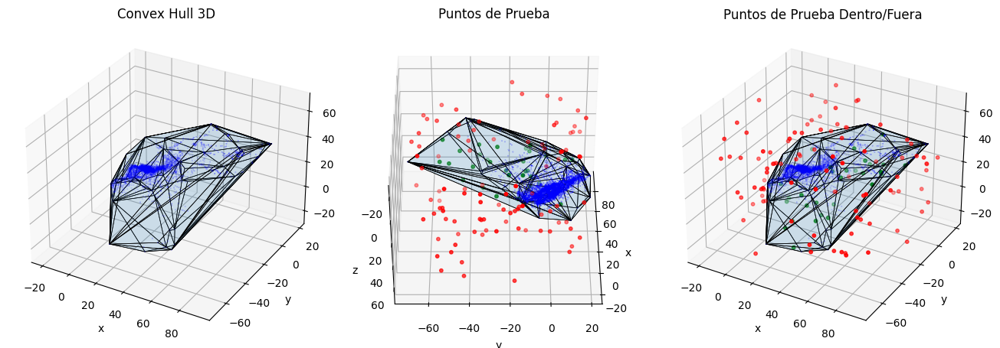

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# Definir los puntos en 3D
x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Elegir un número pequeño de puntos aleatorios por coordenada
n_points_per_coord = 5000
sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=True)
sample_points = points_3d[sample_indices]

# Calcular la envolvente convexa
hull_3d = ConvexHull(sample_points)

# Crear una malla de puntos para visualizar la superficie del Convex Hull
x_min, x_max = np.min(sample_points[:, 0]), np.max(sample_points[:, 0])
y_min, y_max = np.min(sample_points[:, 1]), np.max(sample_points[:, 1])
z_min, z_max = np.min(sample_points[:, 2]), np.max(sample_points[:, 2])
x_mesh, y_mesh, z_mesh = np.meshgrid(np.linspace(x_min, x_max, 50),
                                     np.linspace(y_min, y_max, 50),
                                     np.linspace(z_min, z_max, 50))
mesh_points = np.vstack((x_mesh.flatten(), y_mesh.flatten(), z_mesh.flatten())).T

# Verificar si los puntos de prueba están dentro del Convex Hull
def puntos_prueba_dentro(hull, puntos):
    # Transformar los puntos de prueba al espacio del Convex Hull
    puntos_transformados = hull.equations[:, :-1].dot(puntos.T) + hull.equations[:, -1][:, np.newaxis]
    # Verificar si los puntos están detrás de cada plano del Convex Hull
    esta_dentro = np.all(puntos_transformados <= 0, axis=0)
    return esta_dentro

# Generar puntos de prueba adicionales
n_puntos_prueba = 128
puntos_prueba = np.random.uniform(low=[x_min, y_min, z_min], high=[x_max, y_max, z_max], size=(n_puntos_prueba, 3))

# Verificar qué puntos de prueba están dentro del Convex Hull
esta_dentro_hull = puntos_prueba_dentro(hull_3d, puntos_prueba)

# Visualizar el Convex Hull y los puntos de prueba
fig = plt.figure(figsize=(13, 10))

# Subplot 1: Vista desde el frente
ax1 = fig.add_subplot(131, projection='3d')
ax1.add_collection(Poly3DCollection(sample_points[hull_3d.simplices], alpha=0.1, linewidths=0.5, edgecolors='k'))
ax1.scatter(sample_points[:, 0], sample_points[:, 1], sample_points[:, 2], color='blue', s=0.03)
ax1.set_title('Convex Hull 3D')
ax1.set_xlabel('x')
ax1.set_ylabel('y')
ax1.set_zlabel('z')


# Subplot 2: Vista desde arriba
ax2 = fig.add_subplot(132, projection='3d')
ax2.add_collection(Poly3DCollection(sample_points[hull_3d.simplices], alpha=0.1, linewidths=0.5, edgecolors='k'))
ax2.scatter(sample_points[:, 0], sample_points[:, 1], sample_points[:, 2], color='blue', s=0.03)
ax2.scatter(puntos_prueba[esta_dentro_hull][:, 0], puntos_prueba[esta_dentro_hull][:, 1], puntos_prueba[esta_dentro_hull][:, 2], color='green', s=10)
ax2.scatter(puntos_prueba[~esta_dentro_hull][:, 0], puntos_prueba[~esta_dentro_hull][:, 1], puntos_prueba[~esta_dentro_hull][:, 2], color='red', s=10)
ax2.set_title('Puntos de Prueba')
ax2.view_init(220,360)
ax2.set_xlabel('x')
ax2.set_ylabel('y')
ax2.set_zlabel('z')

# Subplot 3: Vista desde el lado
ax3 = fig.add_subplot(133, projection='3d')
ax3.add_collection(Poly3DCollection(sample_points[hull_3d.simplices], alpha=0.1, linewidths=0.5, edgecolors='k'))
ax3.scatter(sample_points[:, 0], sample_points[:, 1], sample_points[:, 2], color='blue', s=0.03)
ax3.scatter(puntos_prueba[esta_dentro_hull][:, 0], puntos_prueba[esta_dentro_hull][:, 1], puntos_prueba[esta_dentro_hull][:, 2], color='green', s=10)
ax3.scatter(puntos_prueba[~esta_dentro_hull][:, 0], puntos_prueba[~esta_dentro_hull][:, 1], puntos_prueba[~esta_dentro_hull][:, 2], color='red', s=10)
ax3.set_title('Puntos de Prueba Dentro/Fuera')
ax3.set_xlabel('x')
ax3.set_ylabel('y')
ax3.set_zlabel('z')

plt.tight_layout()
plt.show()


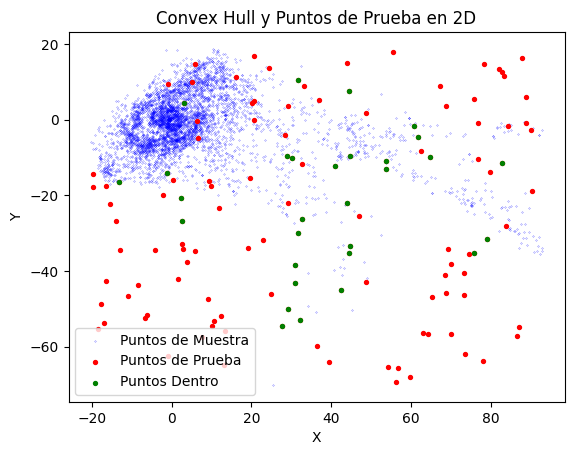

In [13]:


# Graficar los puntos de muestra y los puntos de prueba en 2D
plt.scatter(sample_points[:, 0], sample_points[:, 1], color='blue', label='Puntos de Muestra', s=0.03)
plt.scatter(puntos_prueba[:, 0], puntos_prueba[:, 1], color='red', label='Puntos de Prueba', s=8)
plt.scatter(puntos_prueba[esta_dentro_hull][:, 0], puntos_prueba[esta_dentro_hull][:, 1], color='green', label='Puntos Dentro', s=8)
plt.legend()
plt.title('Convex Hull y Puntos de Prueba en 2D')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()



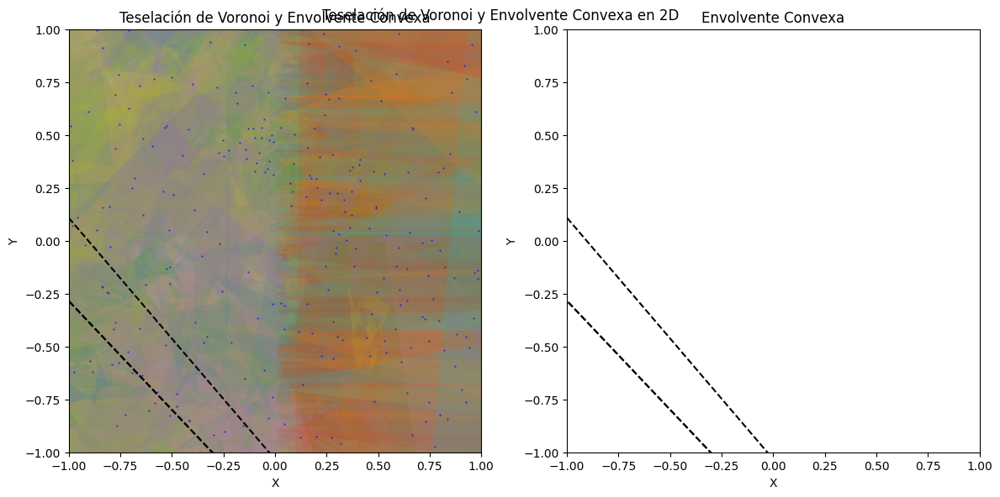

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pyhull.voronoi import VoronoiTess

x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Elegir un número pequeño de puntos aleatorios por coordenada
n_points_per_coord = 5000
sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=False)
sample_points = points_3d[sample_indices]

# Calcular la envolvente convexa
hull_3d = ConvexHull(sample_points)

# Calcular la teselación de Voronoi para la muestra de puntos
voronoi_sample = VoronoiTess(sample_points)
vertices_voronoi = np.array(voronoi_sample.vertices)  # Convertir a NumPy array
regions_voronoi = voronoi_sample.regions

# Crear una figura con dos subgráficos en una fila
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Graficar la teselación de Voronoi en el primer subgráfico
for region in regions_voronoi:
    polygon = [vertices_voronoi[i] for i in region]
    axs[0].fill(*zip(*polygon), alpha=0.15)

# Graficar la envolvente convexa en el primer subgráfico
for simplex in hull_3d.simplices:
    axs[0].plot(sample_points[simplex, 0], sample_points[simplex, 1], 'k--')

# Graficar los puntos generados en el primer subgráfico
axs[0].scatter(sample_points[:, 0], sample_points[:, 1], color='blue', marker='o', s=0.15)

# Configuración del primer subgráfico
axs[0].set_title('Teselación de Voronoi y Envolvente Convexa')
axs[0].set_xlim(-1, 1)
axs[0].set_ylim(-1, 1)
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')

# Graficar solo la envolvente convexa en el segundo subgráfico
for simplex in hull_3d.simplices:
    axs[1].plot(sample_points[simplex, 0], sample_points[simplex, 1], 'k--')

# Configuración del segundo subgráfico
axs[1].set_title('Envolvente Convexa')
axs[1].set_xlim(-1, 1)
axs[1].set_ylim(-1, 1)
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')

# Ajustar el diseño para evitar superposiciones
plt.tight_layout()

# Mostrar los gráficos
plt.suptitle('Teselación de Voronoi y Envolvente Convexa en 2D')
plt.show()

In [ ]:
from matplotlib.path import Path

# Función para calcular el área de un polígono convexo
def calcular_area_poligono(vertices):
    n = len(vertices)
    area = 0
    for i in range(n):
        j = (i + 1) % n
        area += vertices[i][0] * vertices[j][1] - vertices[j][0] * vertices[i][1]
    return abs(area) / 2

# Función para verificar si un punto está dentro del polígono convexo
def punto_en_poligono(punto, vertices_poligono):
    path = Path(vertices_poligono)
    return path.contains_point(punto)

# Ejemplo de uso
vertices_convex_hull = [(0, 0), (0, 5), (3, 7), (7, 5), (5, 0)]  # Ejemplo de vértices del Convex Hull
area_poligono = calcular_area_poligono(vertices_convex_hull)
print("Área del polígono convexo:", area_poligono)

punto_prueba = (2, 3)  # Punto de prueba
esta_dentro = punto_en_poligono(punto_prueba, vertices_convex_hull)
if esta_dentro:
    print(f"El punto {punto_prueba} está dentro del polígono convexo.")
else:
    print(f"El punto {punto_prueba} está fuera del polígono convexo.")


Área del polígono convexo: 37.0
El punto (2, 3) está dentro del polígono convexo.


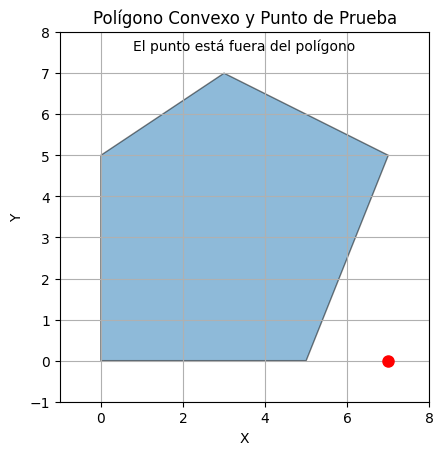

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon

# Función para graficar el polígono convexo y el punto de prueba
def graficar_poligono_y_punto(vertices_poligono, punto, esta_dentro):
    fig, ax = plt.subplots()

    # Dibujar el polígono convexo
    poligono = Polygon(vertices_poligono, closed=True, edgecolor='black', linewidth=1, alpha=0.5)
    ax.add_patch(poligono)

    # Dibujar el punto de prueba
    ax.plot(punto[0], punto[1], marker='o', color='red', markersize=8)

    # Configuración de la gráfica
    ax.set_xlim(-1, 8)
    ax.set_ylim(-1, 8)
    ax.set_aspect('equal', adjustable='box')
    ax.set_title('Polígono Convexo y Punto de Prueba')

    # Anotar si el punto está dentro o fuera del polígono
    texto = f'El punto está {"dentro" if esta_dentro else "fuera"} del polígono'
    ax.annotate(texto, xy=(0.5, 0.95), xycoords='axes fraction', ha='center')

    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(True)
    plt.show()

# Ejemplo de uso
vertices_convex_hull = [(0, 0), (0, 5), (3, 7), (7, 5), (5, 0)]  # Ejemplo de vértices del Convex Hull
punto_prueba = (7, 0)  # Punto de prueba
area_poligono = calcular_area_poligono(vertices_convex_hull)

# Verificar si el punto está dentro del polígono convexo
esta_dentro = punto_en_poligono(punto_prueba, vertices_convex_hull)

# Graficar el polígono y el punto de prueba
graficar_poligono_y_punto(vertices_convex_hull, punto_prueba, esta_dentro)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pyhull.voronoi import VoronoiTess
from scipy.spatial import ConvexHull  # Importar ConvexHull desde scipy.spatial

# Función para calcular el área de un polígono convexo
def calcular_area_poligono(vertices):
    n = len(vertices)
    area = 0
    for i in range(n):
        j = (i + 1) % n
        area += vertices[i][0] * vertices[j][1] - vertices[j][0] * vertices[i][1]
    return abs(area) / 2

# Función para verificar si un punto está dentro del polígono convexo
def punto_en_poligono(punto, vertices_poligono):
    path = plt.Path(vertices_poligono)
    return path.contains_point(punto)

# Cargar datos de puntos originales
x_original = original_vector[:, 0]
y_original = original_vector[:, 1]
z_original = original_vector[:, 2]
points_3d_original = np.vstack((x_original, y_original, z_original)).T

# Calcular la envolvente convexa de los puntos originales
hull_original = ConvexHull(points_3d_original)

# Definir puntos a probar
puntos_prueba = [(0, 0, 0), (1, 1, 1), (5, 5, 5), (-10, -10, -10)]

# Verificar pertenencia y generar listas de índices
indices_incluidos = []
indices_excluidos = []

for i, punto in enumerate(puntos_prueba):
    esta_dentro = punto_en_poligono(punto, hull_original.points[hull_original.vertices])
    if esta_dentro:
        indices_incluidos.append(i)
    else:
        indices_excluidos.append(i)

# Mostrar resultados
print("Total de puntos incluidos:", len(indices_incluidos))
print("Índices de puntos incluidos:", indices_incluidos)
print("Total de puntos excluidos:", len(indices_excluidos))
print("Índices de puntos excluidos:", indices_excluidos)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pyhull.voronoi import VoronoiTess
from scipy.spatial import ConvexHull

# Función para calcular el área de un polígono convexo
def calcular_area_poligono(vertices):
    n = len(vertices)
    area = 0
    for i in range(n):
        j = (i + 1) % n
        area += vertices[i][0] * vertices[j][1] - vertices[j][0] * vertices[i][1]
    return abs(area) / 2

# Función para verificar si un punto está dentro del polígono convexo
def punto_en_poligono(punto, vertices_poligono):
    path = plt.Path(vertices_poligono)
    return path.contains_point(punto)

x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Calcular la envolvente convexa
hull_3d = ConvexHull(points_3d)

# Calcular la teselación de Voronoi para la muestra de puntos
voronoi_sample = VoronoiTess(points_3d)
vertices_voronoi = np.array(voronoi_sample.vertices)  # Convertir a NumPy array
regions_voronoi = voronoi_sample.regions

# Función para graficar el polígono convexo y el punto de prueba
def graficar_poligono_y_punto(vertices_poligono, punto, esta_dentro):
    fig, ax = plt.subplots()

    # Dibujar el polígono convexo
    poligono = plt.Polygon(vertices_poligono, closed=True, edgecolor='black', linewidth=1, alpha=0.5)
    ax.add_patch(poligono)

    # Dibujar el punto de prueba
    ax.plot(punto[0], punto[1], marker='o', color='red', markersize=8)

    # Configuración de la gráfica
    ax.set_xlim(-50, 50)
    ax.set_ylim(-50, 50)
    ax.set_aspect('equal', adjustable='box')
    ax.set_title('Polígono Convexo y Punto de Prueba')

    # Anotar si el punto está dentro o fuera del polígono
    texto = f'El punto está {"dentro" if esta_dentro else "fuera"} del polígono'
    ax.annotate(texto, xy=(0.5, 0.95), xycoords='axes fraction', ha='center')

    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid(True)
    plt.show()

# Generar puntos de prueba
x_original = original_vector[:, 0]
y_original = original_vector[:, 1]
z_original = original_vector[:, 2]
points_3d_original = np.vstack((x_original, y_original, z_original)).T

# Listas para almacenar los índices de puntos dentro y fuera del polígono convexo
indices_dentro = []
indices_fuera = []

# Verificar si los puntos de prueba están dentro del Convex Hull
for i, punto in enumerate(points_3d_original):
    esta_dentro = punto_en_poligono(punto[:2], hull_3d.points[hull_3d.vertices])
    if esta_dentro:
        indices_dentro.append(i)
    else:
        indices_fuera.append(i)

# Calcular el área del polígono convexo
area_poligono = calcular_area_poligono(hull_3d.points[hull_3d.vertices])

# Imprimir resultados
print("Área del polígono convexo:", area_poligono)
print("Total de puntos dentro:", len(indices_dentro))
print("Total de puntos fuera:", len(indices_fuera))

# Graficar el polígono convexo y los puntos de prueba
graficar_poligono_y_punto(hull_3d.points[hull_3d.vertices], (0, 0), True)  # Punto de prueba en el origen


AttributeError: module 'matplotlib.pyplot' has no attribute 'Path'

In [ ]:

x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Elegir un número pequeño de puntos aleatorios por coordenada
n_points_per_coord = 5000
sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=False)
sample_points = points_3d[sample_indices]

# Calcular la envolvente convexa
hull_3d = ConvexHull(sample_points)

# Preparar los datos para Plotly
vertices = hull_3d.vertices
vertices.append(vertices[0])  # cerrar el polígono

x_hull = points_3d[vertices, 0]
y_hull = points_3d[vertices, 1]
z_hull = points_3d[vertices, 2]

# Calcular la teselación de Voronoi para la muestra de puntos
voronoi_sample = VoronoiTess(sample_points)
vertices_voronoi = np.array(voronoi_sample.vertices)  # Convertir a NumPy array
regions_voronoi = voronoi_sample.regions


fig = go.Figure()

# Agregar los puntos 3D
fig.add_trace(go.Scatter3d(
    x=points_3d[:, 0],
    y=points_3d[:, 1],
    z=points_3d[:, 2],
    mode='markers',
    marker=dict(
        size=0.6,
        color='blue',
        opacity=0.8
    ),
    name='Puntos 3D'
))
# Agregar la teselación de Voronoi para la muestra
for region in regions_voronoi:
    if -1 not in region:
        x_region = vertices_voronoi[region, 0]
        y_region = vertices_voronoi[region, 1]
        z_region = vertices_voronoi[region, 2]
        fig.add_trace(go.Scatter3d(
            x=x_region.tolist() + [x_region[0]],  # Cerrar el polígono
            y=y_region.tolist() + [y_region[0]],  # Cerrar el polígono
            z=z_region.tolist() + [z_region[0]],  # Cerrar el polígono
            mode='lines',
            line=dict(
                color='red',
                width=1
            ),
            name=''
        ))

# Configurar el diseño de la figura
fig.update_layout(
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    )
)

# Mostrar la figura interactiva
fig.show()

In [ ]:
import numpy as np
import plotly.graph_objects as go
from pyhull.voronoi import VoronoiTess

# Supongamos que tienes tus puntos 3D originales
x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Elegir un número pequeño de puntos aleatorios por coordenada
n_points_per_coord = 5000
sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=False)
sample_points = points_3d[sample_indices]

# Calcular la teselación de Voronoi para la muestra de puntos
voronoi_sample = VoronoiTess(sample_points)
vertices_voronoi = np.array(voronoi_sample.vertices)  # Convertir a NumPy array
regions_voronoi = voronoi_sample.regions

# Preparar los datos para Plotly
fig = go.Figure()

# Agregar los puntos 3D de la muestra
fig.add_trace(go.Scatter3d(
    x=sample_points[:, 0],
    y=sample_points[:, 1],
    z=sample_points[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color='red',
        opacity=0.8
    ),
    name='Puntos 3D de la Muestra'
))

# Agregar la teselación de Voronoi para la muestra
for region in regions_voronoi:
    if -1 not in region:
        x_region = vertices_voronoi[region, 0]
        y_region = vertices_voronoi[region, 1]
        z_region = np.zeros_like(x_region)  # Todos los puntos en el mismo plano Z=0
        fig.add_trace(go.Scatter3d(
            x=x_region.tolist() + [x_region[0]],  # Cerrar el polígono
            y=y_region.tolist() + [y_region[0]],  # Cerrar el polígono
            z=z_region.tolist() + [z_region[0]],  # Cerrar el polígono
            mode='lines',
            line=dict(
                color='black',
                width=1
            ),
            name='Teselación de Voronoi de la Muestra'
        ))

# Configurar el diseño de la figura
fig.update_layout(
    title='Teselación de Voronoi en 3D para Muestra Aleatoria',
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    )
)

# Mostrar la figura interactiva
fig.show()


In [ ]:
import numpy as np
from scipy.spatial import ConvexHull
import plotly.graph_objects as go
from pyhull.voronoi import VoronoiTess

# Crear los datos
x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T


# Calcular la teselación de Voronoi
voronoi = VoronoiTess(points_3d)
vertices_voronoi = np.array(voronoi.vertices)  # Convertir a NumPy array
regions_voronoi = voronoi.regions

# Preparar los datos para Plotly
fig = go.Figure()

# Agregar los puntos 3D
fig.add_trace(go.Scatter3d(
    x=points_3d[:, 0],
    y=points_3d[:, 1],
    z=points_3d[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color='red',
        opacity=0.8
    ),
    name='Puntos 3D'
))

# Agregar la teselación de Voronoi
for region in regions_voronoi:
    if -1 not in region:
        x_region = vertices_voronoi[region, 0]
        y_region = vertices_voronoi[region, 1]
        z_region = np.zeros_like(x_region)  # Todos los puntos en el mismo plano Z=0
        fig.add_trace(go.Scatter3d(
            x=x_region.tolist() + [x_region[0]],  # Cerrar el polígono
            y=y_region.tolist() + [y_region[0]],  # Cerrar el polígono
            z=z_region.tolist() + [z_region[0]],  # Cerrar el polígono
            mode='lines',
            line=dict(
                color='black',
                width=1
            ),
            name='Teselación de Voronoi'
        ))

# Configurar el diseño de la figura
fig.update_layout(
    title='Teselación de Voronoi en 3D',
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    )
)

# Mostrar la figura interactiva
fig.show()



In [ ]:
import numpy as np
from scipy.spatial import ConvexHull
import plotly.graph_objects as go
from pyhull.voronoi import VoronoiTess

# Supongamos que tienes tus puntos 3D originales
x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Elegir un número pequeño de puntos aleatorios por coordenada
n_points_per_coord = 5000
sample_indices = np.random.choice(points_3d.shape[0], n_points_per_coord, replace=False)
sample_points = points_3d[sample_indices]

# Calcular la teselación de Voronoi para la muestra de puntos
voronoi_sample = VoronoiTess(sample_points)
vertices_voronoi = np.array(voronoi_sample.vertices)  # Convertir a NumPy array
regions_voronoi = voronoi_sample.regions

# Preparar los datos para Plotly
fig = go.Figure()

# Agregar los puntos 3D de la muestra
fig.add_trace(go.Scatter3d(
    x=sample_points[:, 0],
    y=sample_points[:, 1],
    z=sample_points[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color='red',
        opacity=0.8
    ),
    name='Puntos 3D de la Muestra'
))

# Agregar la teselación de Voronoi para la muestra
for region in regions_voronoi:
    if -1 not in region:
        x_region = vertices_voronoi[region, 0]
        y_region = vertices_voronoi[region, 1]
        z_region = np.zeros_like(x_region)  # Todos los puntos en el mismo plano Z=0
        fig.add_trace(go.Scatter3d(
            x=x_region.tolist() + [x_region[0]],  # Cerrar el polígono
            y=y_region.tolist() + [y_region[0]],  # Cerrar el polígono
            z=z_region.tolist() + [z_region[0]],  # Cerrar el polígono
            mode='lines',
            line=dict(
                color='black',
                width=1
            ),
            name='Teselación de Voronoi de la Muestra'
        ))

# Calcular la envolvente convexa para los puntos de la muestra
hull_sample = ConvexHull(sample_points)

# Agregar la envolvente convexa
fig.add_trace(go.Mesh3d(
    x=hull_sample.points[hull_sample.vertices, 0],
    y=hull_sample.points[hull_sample.vertices, 1],
    z=hull_sample.points[hull_sample.vertices, 2],
    alphahull=0,  # 0 significa envolvente convexa
    opacity=1,
    color="#%06x" % np.random.randint(0, 0xFFFFFF),
    name='Envolvente Convexa de la Muestra'
))

# Configurar el diseño de la figura
fig.update_layout(
    title='Teselación de Voronoi y Envolvente Convexa en 3D para Muestra Aleatoria',
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    )
)

# Mostrar la figura interactiva
fig.show()


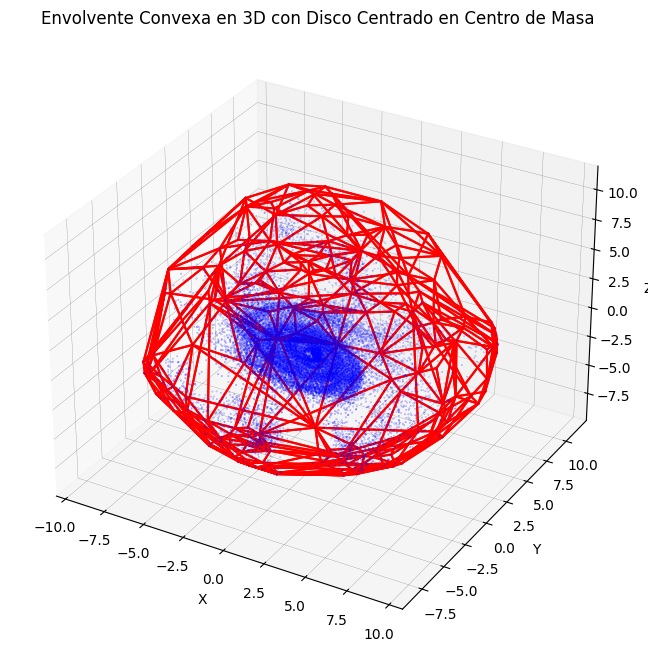

In [ ]:
import numpy as np
from pyhull.convex_hull import ConvexHull
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]
z = rotated_vectors[:, 2]
points_3d = np.vstack((x, y, z)).T

# Calcular la distancia euclidiana de cada punto al centro de masa
center_of_mass = simulation.calculate_center_of_mass_new()
distances_to_center = np.sqrt((x - center_of_mass[0])**2 + (y - center_of_mass[1])**2 + (z - center_of_mass[2])**2)

# Filtrar los puntos que están dentro del radio deseado
limit_radius = 10  # Radio deseado
points_within_radius = points_3d[distances_to_center <= limit_radius]

hull_3d = ConvexHull(points_within_radius)

# Visualizar la envolvente convexa en 3D
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(points_within_radius[:, 0], points_within_radius[:, 1], points_within_radius[:, 2], c='blue', s=0.03)
for simplex in hull_3d.vertices:
    simplex = np.append(simplex, simplex[0])  # cerrar el polígono
    ax.plot(points_within_radius[simplex, 0], points_within_radius[simplex, 1], points_within_radius[simplex, 2], 'r-')
ax.set_title('Envolvente Convexa en 3D con Disco Centrado en Centro de Masa')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()


IndexError: index 24851 is out of bounds for axis 0 with size 18367

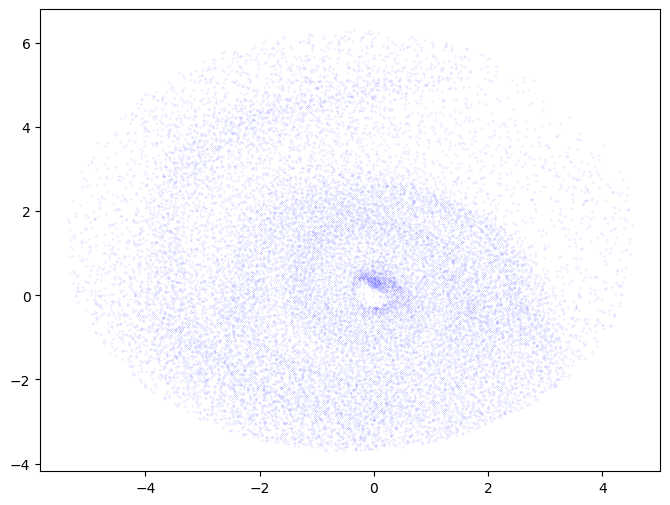

In [ ]:
plt.figure(figsize=(8, 6))

x = rotated_vectors[:, 0]
y = rotated_vectors[:, 1]

limit_radius=5

distances = np.sqrt((x - center_of_mass[0])**2 + (y - center_of_mass[1])**2)
points_within_radius = rotated_vectors[distances <= limit_radius]

plt.scatter(points_within_radius[:, 0], points_within_radius[:, 1], c='blue', s=0.003)
for simplex in hull.vertices:
    plt.plot(points_within_radius[simplex, 0], points_within_radius[simplex, 1], 'r-')
plt.title('Envolvente Convexa en 2D')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

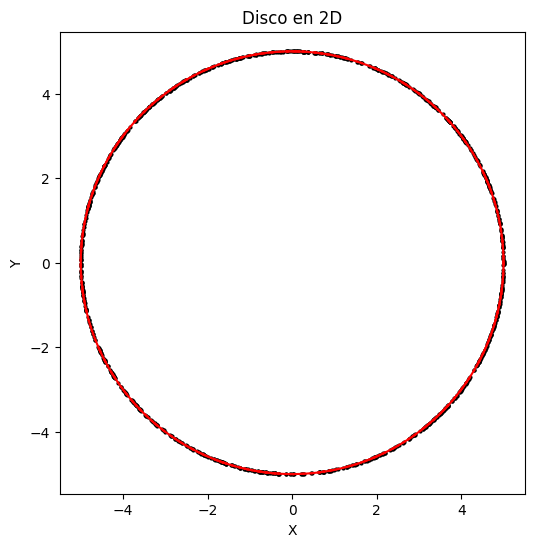

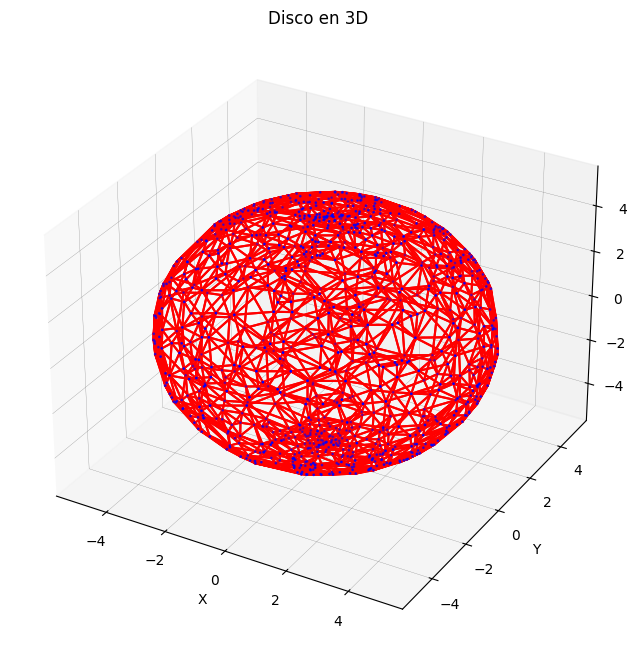

In [ ]:
import numpy as np
from pyhull.convex_hull import ConvexHull
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Generar puntos aleatorios dentro de un círculo en 2D
np.random.seed(0)
radius = 5
num_points = 1000
angles = np.random.uniform(0, 2 * np.pi, num_points)
points_2d = radius * np.vstack((np.cos(angles), np.sin(angles))).T

# Calcular la envolvente convexa en 2D
hull_2d = ConvexHull(points_2d)

# Visualizar el disco en 2D
plt.figure(figsize=(6, 6))
plt.plot(points_2d[:, 0], points_2d[:, 1], 'ko', markersize=2)
for simplex in hull_2d.vertices:
    plt.plot(points_2d[simplex, 0], points_2d[simplex, 1], 'r-')
plt.title('Disco en 2D')
plt.xlabel('X')
plt.ylabel('Y')
plt.axis('equal')
plt.show()

# Generar puntos aleatorios dentro de una esfera en 3D
np.random.seed(0)
radius_3d = 5
num_points_3d = 1000
phi = np.random.uniform(0, np.pi, num_points_3d)
theta = np.random.uniform(0, 2 * np.pi, num_points_3d)
x_3d = radius_3d * np.sin(phi) * np.cos(theta)
y_3d = radius_3d * np.sin(phi) * np.sin(theta)
z_3d = radius_3d * np.cos(phi)
points_3d = np.vstack((x_3d, y_3d, z_3d)).T

# Calcular la envolvente convexa en 3D
hull_3d = ConvexHull(points_3d)

# Visualizar el disco en 3D
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(points_3d[:, 0], points_3d[:, 1], points_3d[:, 2], c='blue', s=1)
for simplex in hull_3d.vertices:
    simplex = np.append(simplex, simplex[0])  # cerrar el polígono
    ax.plot(points_3d[simplex, 0], points_3d[simplex, 1], points_3d[simplex, 2], 'r-')
ax.set_title('Disco en 3D')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()


Centro de Masa: [-0.4114099   1.30477423  1.14327347]
Momento Angular Total: [ 8251761.37933625 -3245441.51430585   830785.27387827]
La componente más grande del momento angular es: 0 -- sign -- 1.0
--------------------------------------------------------------------------------
Vector Original: [ 8251761.37933625 -3245441.51430585   830785.27387827]
Vector Rotado: [ -830785.27387827 -3245441.51430585  8251761.37933625]
--------------------------------------------------------------------------------
                                                                                


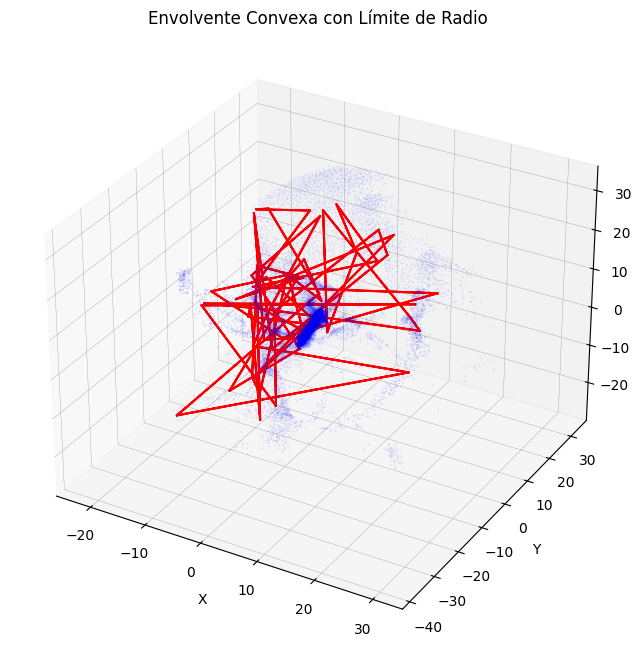

In [ ]:
if __name__ == "__main__":
    simulation = GasSimulation('dhc_halo_418336.gas')
    center_of_mass = simulation.calculate_center_of_mass_new()
    total_angular_momentum = simulation.calculate_total_angular_momentum()
    angular_direction = np.sign(total_angular_momentum)
    largest_component = np.argmax(np.abs(total_angular_momentum))

    print("Centro de Masa:", center_of_mass)
    print("Momento Angular Total:", total_angular_momentum)
    print("La componente más grande del momento angular es:", largest_component, '-- sign --', angular_direction[largest_component])

    simulation.visualize_rotated_vector()

    direction = angular_direction[largest_component]
    angle_rotation_matrix = simulation.choose_rotation_matrix(largest_component, direction)

    # Vector a rotar, ahora es el vector posición
    original_vector = simulation.accumulated_data[:, :3]

    # Aplicar la rotación al vector posición
    rotated_vectors = simulation.apply_rotation(angle_rotation_matrix, original_vector)

    # Calcular y visualizar la envolvente convexa con límite de radio
    limit_radius = 10  # Puedes ajustar el radio según tus necesidades
    hull = simulation.calculate_convex_hull(limit_radius, rotated_vectors)
    simulation.visualize_convex_hull(hull)

Centro de Masa: [-0.4114099   1.30477423  1.14327347]
Momento Angular Total: [ 8251761.37933625 -3245441.51430585   830785.27387827]
La componente más grande del momento angular es: 0 -- sign -- 1.0
--------------------------------------------------------------------------------
Vector Original: [ 8251761.37933625 -3245441.51430585   830785.27387827]
Vector Rotado: [ -830785.27387827 -3245441.51430585  8251761.37933625]
--------------------------------------------------------------------------------
                                                                                


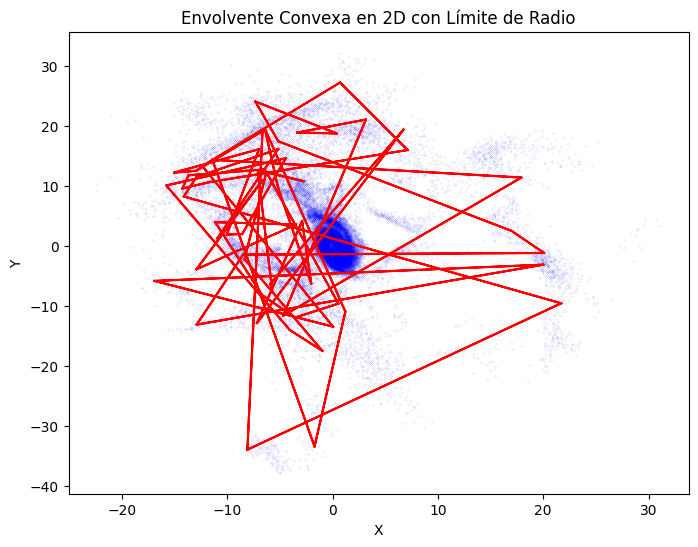

In [ ]:
if __name__ == "__main__":
    simulation = GasSimulation('dhc_halo_418336.gas')
    center_of_mass = simulation.calculate_center_of_mass_new()
    total_angular_momentum = simulation.calculate_total_angular_momentum()
    angular_direction = np.sign(total_angular_momentum)
    largest_component = np.argmax(np.abs(total_angular_momentum))

    print("Centro de Masa:", center_of_mass)
    print("Momento Angular Total:", total_angular_momentum)
    print("La componente más grande del momento angular es:", largest_component, '-- sign --', angular_direction[largest_component])

    simulation.visualize_rotated_vector()

    direction = angular_direction[largest_component]
    angle_rotation_matrix = simulation.choose_rotation_matrix(largest_component, direction)

    # Vector a rotar, ahora es el vector posición
    original_vector = simulation.accumulated_data[:, :3]

    # Aplicar la rotación al vector posición
    rotated_vectors = simulation.apply_rotation(angle_rotation_matrix, original_vector)

    # Calcular y visualizar la envolvente convexa con límite de radio
    limit_radius = 10  # Puedes ajustar el radio según tus necesidades
    hull = simulation.calculate_convex_hull(limit_radius,rotated_vectors )
    simulation.visualize_convex_hull_2d(hull)

In [ ]:
import pandas as pd

# Ruta de los archivos en tu sistema local
# ruta_archivos = '/ruta/a/tu/carpeta/con/archivos/'

# Nombre de los archivos
halo_files = ['dhc_halo_11.gas', 'dhc_halo_17.gas', 'dhc_halo_117256.gas', 'dhc_halo_198185.gas', 'dhc_halo_418336.gas']

# Cargar cada archivo en un DataFrame de Pandas
archivos_dataframes = []
for archivo in halo_files:
    df = pd.read_csv(archivo, sep=' ', names=['x', 'y', 'z', 'vx', 'vy', 'vz', 'lxvel', 'lyvel', 'lzvel', 'Potential', 'U', 'rho'], header=None)
    archivos_dataframes.append(df)

# Ahora tienes una lista de DataFrames, uno por cada archivo
# Puedes acceder a cada DataFrame usando archivos_dataframes[0], archivos_dataframes[1], etc.


In [ ]:
halo_files = ['dhc_halo_11.gas', 'dhc_halo_17.gas', 'dhc_halo_117256.gas', 'dhc_halo_198185.gas', 'dhc_halo_418336.gas']


'dhc_halo_11.gas'

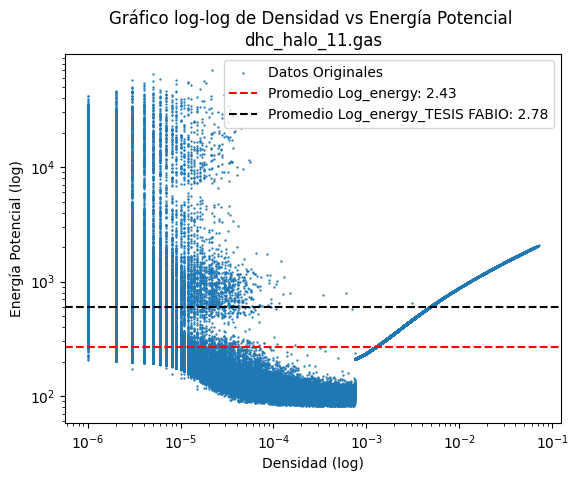

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Obtener los datos x e y del primer DataFrame en la lista
x = archivos_dataframes[0]['rho']
y = archivos_dataframes[0]['U']

# Calcular el promedio de Log_energy
Log_energy = np.log10(archivos_dataframes[0]['U'])
avg_energy = np.mean(Log_energy)

# Filtrar los datos que cumplen la condición y graficarlos
#y1 = y[y < avg_energy]

# Graficar en escala log-log
plt.scatter(x, y, s=0.4, label='Datos Originales')
plt.axhline(y=10**avg_energy, color='r', linestyle='--', label=f'Promedio Log_energy: {avg_energy:.2f}')
plt.axhline(y=10**2.78, color='k', linestyle='--', label=f'Promedio Log_energy_TESIS FABIO: 2.78')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Densidad (log)')
plt.ylabel('Energía Potencial (log)')
plt.title('Gráfico log-log de Densidad vs Energía Potencial \n' + halo_files[0])
plt.legend()
plt.show()


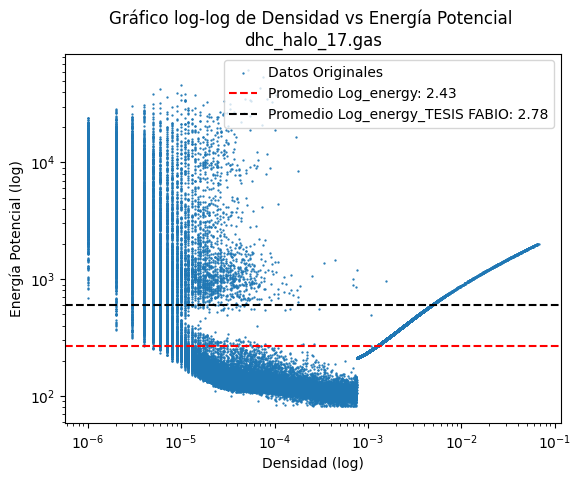

In [ ]:
# Obtener los datos x e y del primer DataFrame en la lista
x = archivos_dataframes[1]['rho']
y = archivos_dataframes[1]['U']

# Calcular el promedio de Log_energy
Log_energy = np.log10(archivos_dataframes[0]['U'])
avg_energy = np.mean(Log_energy)

# Filtrar los datos que cumplen la condición y graficarlos
#y1 = y[y < avg_energy]

# Graficar en escala log-log
plt.scatter(x, y, s=0.4, label='Datos Originales')
plt.axhline(y=10**avg_energy, color='r', linestyle='--', label=f'Promedio Log_energy: {avg_energy:.2f}')
plt.axhline(y=10**2.78, color='k', linestyle='--', label=f'Promedio Log_energy_TESIS FABIO: 2.78')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Densidad (log)')
plt.ylabel('Energía Potencial (log)')
plt.title('Gráfico log-log de Densidad vs Energía Potencial \n' + halo_files[1])
plt.legend()
plt.show()

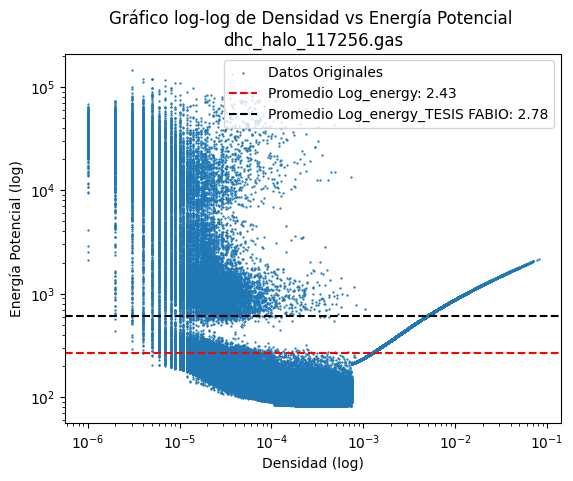

In [ ]:
# Obtener los datos x e y del primer DataFrame en la lista
x = archivos_dataframes[2]['rho']
y = archivos_dataframes[2]['U']

# Calcular el promedio de Log_energy
Log_energy = np.log10(archivos_dataframes[0]['U'])
avg_energy = np.mean(Log_energy)

# Filtrar los datos que cumplen la condición y graficarlos
#y1 = y[y < avg_energy]

# Graficar en escala log-log
plt.scatter(x, y, s=0.4, label='Datos Originales')
plt.axhline(y=10**avg_energy, color='r', linestyle='--', label=f'Promedio Log_energy: {avg_energy:.2f}')
plt.axhline(y=10**2.78, color='k', linestyle='--', label=f'Promedio Log_energy_TESIS FABIO: 2.78')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Densidad (log)')
plt.ylabel('Energía Potencial (log)')
plt.title('Gráfico log-log de Densidad vs Energía Potencial \n' + halo_files[2])
plt.legend()
plt.show()

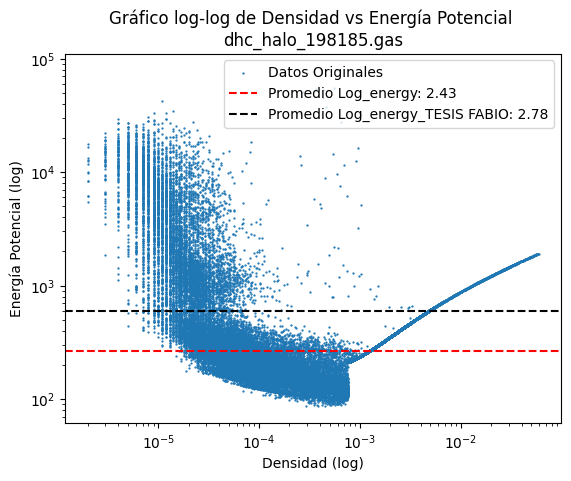

In [ ]:
# Obtener los datos x e y del primer DataFrame en la lista
x = archivos_dataframes[3]['rho']
y = archivos_dataframes[3]['U']

# Calcular el promedio de Log_energy
Log_energy = np.log10(archivos_dataframes[0]['U'])
avg_energy = np.mean(Log_energy)

# Filtrar los datos que cumplen la condición y graficarlos
#y1 = y[y < avg_energy]

# Graficar en escala log-log
plt.scatter(x, y, s=0.4, label='Datos Originales')
plt.axhline(y=10**avg_energy, color='r', linestyle='--', label=f'Promedio Log_energy: {avg_energy:.2f}')
plt.axhline(y=10**2.78, color='k', linestyle='--', label=f'Promedio Log_energy_TESIS FABIO: 2.78')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Densidad (log)')
plt.ylabel('Energía Potencial (log)')
plt.title('Gráfico log-log de Densidad vs Energía Potencial \n' + halo_files[3])
plt.legend()
plt.show()

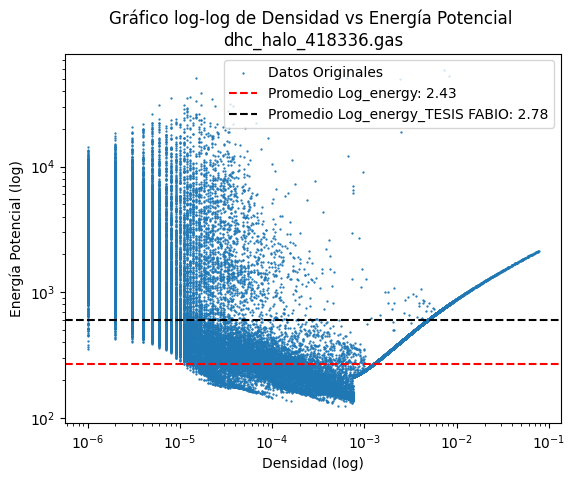

In [ ]:
# Obtener los datos x e y del primer DataFrame en la lista
x = archivos_dataframes[4]['rho']
y = archivos_dataframes[4]['U']

# Calcular el promedio de Log_energy
Log_energy = np.log10(archivos_dataframes[0]['U'])
avg_energy = np.mean(Log_energy)

# Filtrar los datos que cumplen la condición y graficarlos
#y1 = y[y < avg_energy]

# Graficar en escala log-log
plt.scatter(x, y, s=0.4, label='Datos Originales')
plt.axhline(y=10**avg_energy, color='r', linestyle='--', label=f'Promedio Log_energy: {avg_energy:.2f}')
plt.axhline(y=10**2.78, color='k', linestyle='--', label=f'Promedio Log_energy_TESIS FABIO: 2.78')

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Densidad (log)')
plt.ylabel('Energía Potencial (log)')
plt.title('Gráfico log-log de Densidad vs Energía Potencial \n' + halo_files[4])
plt.legend()
plt.show()

In [ ]:
#Tengo porblemas con el disco 117256

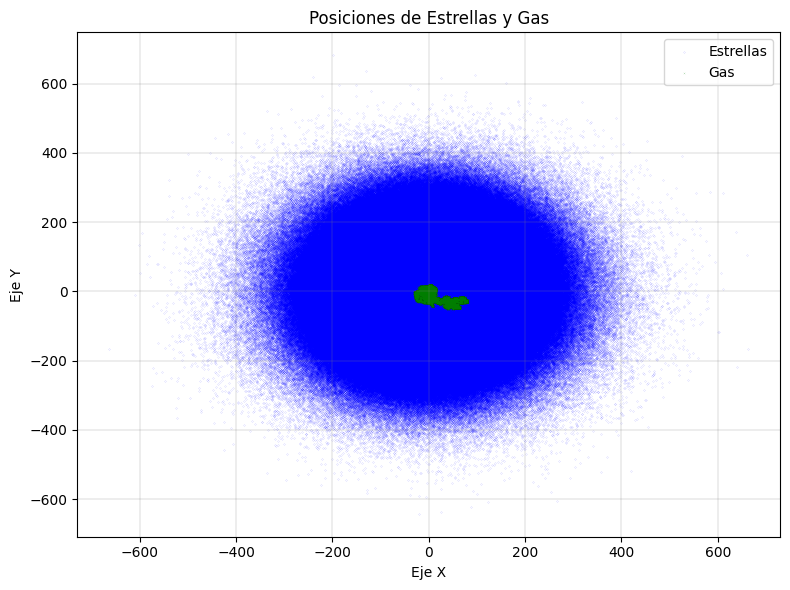

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Cargar el archivo de estrellas
stars_data = pd.read_csv('dhc_halo_117256.stars', sep=' ', names=['x', 'y', 'z', 'vx', 'vy', 'vz'], header=None)

# Cargar el archivo de gas
gas_data = pd.read_csv('dhc_halo_117256.gas', sep=' ', names=['x', 'y', 'z', 'vx', 'vy', 'vz', 'lxvel', 'lyvel', 'lzvel', 'Potential', 'U', 'rho'], header=None)

# Crear la figura y el gráfico
plt.figure(figsize=(8, 6))

# Graficar las posiciones de las estrellas y el gas juntos
plt.scatter(stars_data['x'], stars_data['y'], color='blue', marker='o', s=0.003, label='Estrellas')
plt.scatter(gas_data['x'], gas_data['y'], color='green', marker='x', s=0.003, label='Gas')

# Configuración del gráfico
plt.xlabel('Eje X')
plt.ylabel('Eje Y')
plt.title('Posiciones de Estrellas y Gas')
plt.legend()
plt.grid(True)
plt.tight_layout()

# Mostrar el gráfico
plt.show()
